In [35]:
import numpy as np
from scipy.signal import fftconvolve
from collections import deque

import matplotlib.pyplot as plt

from numpy.polynomial.polynomial import polyval2d
from numpy.polynomial.chebyshev import chebval2d
from scipy.stats import multivariate_normal

from sklearn import linear_model
import pandas as pd
from sklearn.feature_selection import mutual_info_regression
from patsy import dmatrix
from astropy.visualization import ZScaleInterval
interval = ZScaleInterval()

In [74]:
def display_images(template, science, difference, mask, title, scale='5sigma'):
    fig, ax = plt.subplots(1, 4, figsize=(15, 15))
    title_ls = ['template', 'science', 'diff']
    if scale == 'zscale':
        ax[0].imshow(interval(template), cmap='gray', origin='lower')
        ax[1].imshow(interval(science), cmap='gray', origin='lower')
        ax[2].imshow(interval(difference), cmap='gray', origin='lower')
        ax[3].imshow(mask, cmap='gray', origin='lower')
    else:
        m = difference.mean()
        std = difference.std()
        ax[0].imshow(template, vmin=m-5*std, vmax=m+5*std, cmap='gray', origin='lower')
        ax[1].imshow(science, vmin=m-5*std, vmax=m+5*std, cmap='gray', origin='lower')
        ax[2].imshow(difference, vmin=m-5*std, vmax=m+5*std, cmap='gray', origin='lower')
        ax[3].imshow(mask, vmin=m-5*std, vmax=m+5*std, cmap='gray', origin='lower')
    for i in range(3): ax[i].set_axis_off() 
    for i in range(3): ax[i].set_title(title_ls[i])
    plt.suptitle(title, y=0.65)
    
def compute_xy_grids(x_len, y_len):
    x = np.arange(- x_len // 2 + 1, x_len // 2 + 1, 1)
    y = np.arange(- y_len // 2 + 1, y_len // 2 + 1, 1)
    xx, yy = np.meshgrid(x, y)
    return xx, yy

def Gaussian2d(xx, yy, m=[0., 0.], cov=[[1, 0], [0, 1]]):
    grid = np.dstack((xx, yy))
    var = multivariate_normal(mean=m, cov=cov)
    return var.pdf(grid)

##################
# simulate images
def sim_spatially_varying_sigma(x, y, sigma, T=20, alpha=0.):
    sigma_x = sigma + alpha * np.sin(2 * np.pi / T * x) * sigma
    sigma_y = sigma + alpha * np.sin(2 * np.pi / T * y) * sigma
    return sigma_x, sigma_y

def sim_source_catalog(n_sources, x_lim, y_lim, min_flux, max_flux, random_seed=None):
    if random_seed is not None:
        np.random.seed(random_seed)
    x_pos = np.random.uniform(x_lim[0], x_lim[1], n_sources)
    y_pos = np.random.uniform(y_lim[0], y_lim[1], n_sources)  
    fluxes = np.random.uniform(min_flux, max_flux, n_sources)
    source_catalog = {'x_pos': x_pos, 'y_pos': y_pos, 'fluxes': fluxes}
    return source_catalog

def sim_star(x_size, y_size, x, y, flux, psf_sig):
    image_xx, image_yy = compute_xy_grids(x_size, y_size)
    star_im = flux * Gaussian2d(
            image_xx, image_yy, m=[x, y], cov=[[psf_sig, 0], [0, psf_sig]]
        )
    return star_im

def sim_image(image_size, sky_sig, psf_sig, source_catalog, T=20, alpha=0.1):
    image_xx, image_yy = compute_xy_grids(image_size, image_size)
    image_grid = np.dstack((image_xx, image_yy))
    image =  np.random.normal(scale=sky_sig, size=(image_size, image_size))
    # add background sources
    fluxes = source_catalog['fluxes']
    x_pos, y_pos = source_catalog['x_pos'], source_catalog['y_pos']

    for i in range(len(fluxes)):
        x, y = x_pos[i], y_pos[i]
        sigma_x, sigma_y = sim_spatially_varying_sigma(x, y, psf_sig, T=T, alpha=alpha)
        image += fluxes[i] * Gaussian2d(
            image_xx, image_yy, m=[x, y], cov=[[sigma_x, 0], [0, sigma_y]]
        )
    return image
#################################################

    
def ChebyshevGaussian2d(xx, yy, gauss_cov, poly_deg):
    # compute Gaussian
    gau = Gaussian2d(xx, yy, cov=gauss_cov)
    # compute Chebyshev
    x_deg, y_deg = poly_deg[0], poly_deg[1]
    coef_x = np.zeros(x_deg + 1)
    coef_x[x_deg] = 1
    coef_y = np.zeros(y_deg + 1)
    coef_y[y_deg] = 1
    coefs = np.outer(coef_x, coef_y)
    cheb = chebval2d(xx, yy, c=coefs)
    return cheb * gau

def normalize_bases(bases):
    b0 = None
    normalized_bases = deque()
    for b in bases:
        kernel_sum = b.sum()
        if kernel_sum > 1e-9:
            basis = b / kernel_sum
            if b0 is None:
                b0 = basis
                continue
            else:
                basis -= b0
        else:
            basis = b
        normalized_bases.append(basis)
    normalized_bases.appendleft(b0)
    return list(normalized_bases)
    
def ChebyshevGaussianBases(kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]):
    xx, yy = compute_xy_grids(kernel_size, kernel_size)
    kernel_bases = []
    for id_x, x_sig in enumerate(gaussian_sigmas):
        for id_y, y_sig in enumerate(gaussian_sigmas):
            for x_deg in range(poly_degrees[id_x]+1):
                for y_deg in range(poly_degrees[id_y]+1):
                    gauss_cov = [[x_sig, 0.], [0., y_sig]]
                    poly_deg = (x_deg, y_deg)
                    kernel_basis = ChebyshevGaussian2d(xx, yy, gauss_cov, poly_deg)
                    kernel_bases.append(kernel_basis)
    return kernel_bases

def DeltaBases(kernel_size=11):
    kernel_bases = []
    for i in range(kernel_size):
        for j in range(kernel_size):
            basis = np.zeros((kernel_size, kernel_size))
            basis[i][j] = 1
            kernel_bases.append(basis)
    return kernel_bases

def PolyModel(x_size, y_size, degree):
    xx, yy = compute_xy_grids(x_size, y_size)
    xx, yy = xx / x_size, yy / y_size
    spatial_images = []
    for current_deg in range(0, degree + 1):
        for x_deg in range(current_deg + 1):
            y_deg = current_deg - x_deg 
            coef_x = np.zeros(x_deg + 1)
            coef_x[x_deg] = 1
            coef_y = np.zeros(y_deg + 1)
            coef_y[y_deg] = 1
            coefs = np.outer(coef_x, coef_y)
            spatial_image = polyval2d(xx, yy, c=coefs)
            spatial_images.append(spatial_image)
    spatial_images
    return spatial_images

def BsplinesModel(x_size, y_size, dof):
    dof = 3
    xx, yy = compute_xy_grids(x_size, y_size)
    bsplines = dmatrix("te(cr(xx, dof), cc(yy, dof)) - 1", {"xx": xx.ravel(), "yy": yy.ravel(), "dof": dof})
    kernel_bases = []
    for i in range(bsplines.shape[1]):
        basis = bsplines[:, i]
        kernel_bases.append(basis.reshape(y_size, x_size))
    return kernel_bases

def _compute_base_vecs(template, kernel_bases):
    base_vecs = []
    for basis in kernel_bases:
        base_im = fftconvolve(template, basis, mode='same')
        base_vecs.append(base_im.flatten())
    base_vecs = np.vstack(base_vecs).T   
    return base_vecs
"""
def _compute_base_spatial_vecs(base_vecs, spatial_images, constant_scaling=True):
    base_spatial_vecs = []
    for i in range(base_vecs.shape[1]):
        base_vec = base_vecs[:, i]
        if constant_scaling and i == 0:
            base_spatial_vecs.append(base_vec)
            continue
        for j in range(len(spatial_images)):
            spatial_vec =  spatial_images[j].flatten()
            base_spatial_vec = base_vec * spatial_vec
            base_spatial_vecs.append(base_spatial_vec)
    base_spatial_vecs = np.vstack(base_spatial_vecs).T
    return base_spatial_vecs
"""

def _compute_base_spatial_vecs(base_vecs, spatial_images, constant_scaling=True):
    base_spatial_vecs = []
    for j in range(len(spatial_images)):
        spatial_vec = spatial_images[j].flatten()
        for i in range(base_vecs.shape[1]):
            base_vec = base_vecs[:, i]
            base_spatial_vec = base_vec * spatial_vec
            base_spatial_vecs.append(base_spatial_vec)
    base_spatial_vecs = np.vstack(base_spatial_vecs).T
    return base_spatial_vecs    

def AlardLuptonAlgorithm(template, science, kernel_bases, spatial_model, bg_model, regressor, mask=None, constant_scaling=True):
    if constant_scaling:
        kernel_bases = normalize_bases(kernel_bases)
        print('kernel bases normalized')
    base_vecs = _compute_base_vecs(template, kernel_bases)
    base_spatial_vecs = _compute_base_spatial_vecs(base_vecs, spatial_model, constant_scaling=constant_scaling)
    bg_vecs = np.vstack([bg.flatten() for bg in bg_model]).T        
    X = np.concatenate((base_spatial_vecs, bg_vecs), axis=1)
    y = science.flatten()
    if mask is not None:
        X_ma = X[mask.flatten()]
        y_ma = y[mask.flatten()]
        print(X_ma)
        regressor.fit(X_ma, y_ma)
    else:
        regressor.fit(X, y)
    y_pred = regressor.predict(X)
    difference = science - y_pred.reshape(template.shape)
    return difference, regressor, X, y 

In [37]:
image_size = 255
period = image_size * 2
# spatial_strength = 0.01
spatial_strength = 0.
# simulate source catalog
n_background_sources = 50
# image size
edge_offset = 10
x_lim = (- image_size//2 + 1 + edge_offset, image_size//2 + 1 - edge_offset)
y_lim = (- image_size//2 + 1 + edge_offset, image_size//2 + 1 - edge_offset)
# fluxes
min_flux, max_flux = 20000, 50000
# background source
background_src_cat = sim_source_catalog(
    n_background_sources, x_lim,  y_lim, min_flux, max_flux, random_seed=1
)
# image sigma
tmpl_sky_sig, sci_sky_sig = 0.2, 0.2
tmpl_psf_sig, sci_psf_sig = 1.6, 2.2
# simulate images
template = sim_image(image_size, tmpl_sky_sig, tmpl_psf_sig, background_src_cat, T=period, alpha=0)
science = sim_image(image_size, sci_sky_sig, sci_psf_sig, background_src_cat, T=period, alpha=spatial_strength)

# synthetic source injection on simulated images

In [5]:
science += sim_star(image_size, image_size, 0, 0, flux=100000, psf_sig=sci_psf_sig)

In [6]:
# science += sim_star(image_size, image_size, 0, 50, flux=50000, psf_sig=sci_psf_sig)

In [7]:
# science += sim_star(image_size, image_size, 50, 0, flux=150000, psf_sig=sci_psf_sig)

In [9]:
"""
# display kernel bases
fig, ax = plt.subplots(11, 11, figsize=(10,10))
ax_ls = ax.flat
for i in range(len(kernel_bases)):
    ax_ls[i].imshow(kernel_bases[i], origin='lower', cmap='gray')
    ax_ls[i].set_axis_off()
""";

\begin{equation}
    a_q(x, y) = \sum_{\substack{0\le m\le d_q,\\0\le n\le d_q-m}} a_{qmn}x^my^n.
\end{equation}

\begin{equation}
    \tilde{S}(x,y) = \sum_q^{N_{\kappa}} \sum_{\substack{0\le m\le d_q,\\0\le n\le d_q-m}} a_{qmn}x^my^n [\kappa_q \otimes T](x,y). 
\end{equation}

map (q, m, n) to a new index i, define 2D image $x^my^n [\kappa_q \otimes T](x,y)$ as $W_i$, we have

\begin{equation}
    \tilde{S}(x,y) = \sum_i  a_{i}W_i(x,y). 
\end{equation}

Expand W_i to a 1D column vector $\vec{x_i}$, $\tilde{S}$ to a 1D column vector $\vec{\tilde{y}}$, we have the matrix expression

\begin{equation}
    \vec{\tilde{y}} = \begin{bmatrix}
        | & | & | \\
        \vec{W_1} & \ldots & \vec{W_n} \\
        | & | & |
    \end{bmatrix} 
\times
\begin{bmatrix}
    a_1 \\ 
    \ldots \\ 
    a_n
\end{bmatrix}
\end{equation}

This is a linear regression problem with $n$ features. $n$ equals the number of fitting parameters

sfft assumes the kernel size is much smaller than the image size:

$x^my^n \approx (x-r)^m(y-s)^n$

 $x^my^n [\kappa_q \otimes T] \approx [\kappa_q \otimes (x^my^nT)]$
 
 This may not be a good approximation if $m$ or $n$ is high.

In [27]:
100**4, 101**4

(100000000, 104060401)

Another interpretation.

If only the photometric scaling is spatially varying, and we know the true solution, we have $Q+MN$ parameters.

$(\sum_q^Q a_q \kappa_q)\otimes (\sum_{mn}^{MN} b_{mn} x^m y^n T) = \sum a_qb_{mn}[k_q \otimes(x^my_nT)]$

However, if we are fitting $c_j = a_q b_{mn}$, we need to fit $Q \times MN$ parameters. SFFT has more fitting parameters, that is why it works.

###### 

kernel bases normalized


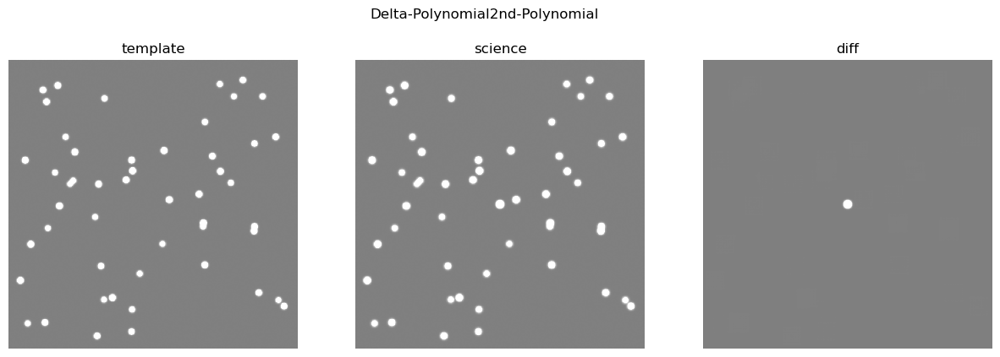

In [18]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = template,
    science = science, 
    kernel_bases = ChebyshevGaussianBases(kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=2), 
    bg_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(fit_intercept=True),
    constant_scaling=True)
display_images(template=template, science=science, difference=difference, title='Delta-Polynomial2nd-Polynomial')

kernel bases normalized


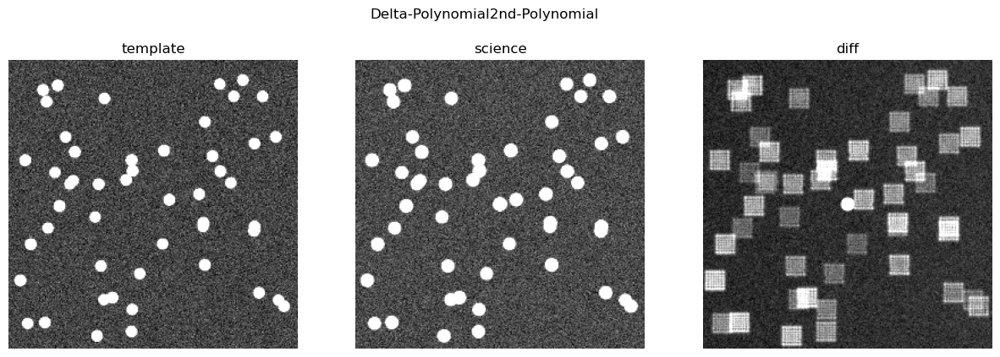

In [29]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = template,
    science = science, 
    kernel_bases = ChebyshevGaussianBases(kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=2), 
    bg_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(fit_intercept=True),
    constant_scaling=True)
display_images(template=template, science=science, difference=difference, title='Delta-Polynomial2nd-Polynomial', scale='zscale')

kernel bases normalized


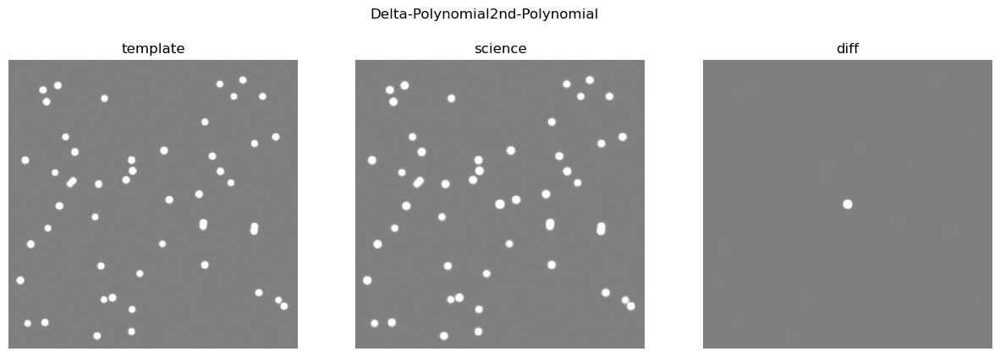

In [19]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = template,
    science = science, 
    kernel_bases = DeltaBases(kernel_size=11),
    spatial_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=2), 
    bg_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(fit_intercept=False),
    constant_scaling=True)
display_images(template=template, science=science, difference=difference, title='Delta-Polynomial2nd-Polynomial')

kernel bases normalized


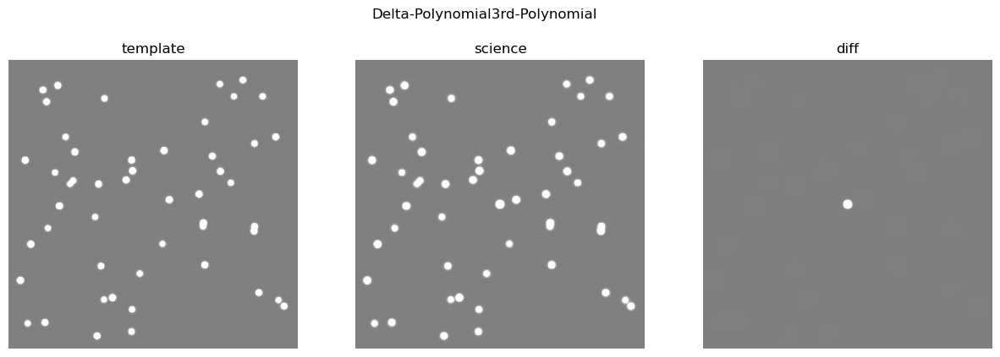

In [21]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = template,
    science = science, 
    kernel_bases = DeltaBases(kernel_size=11),
    spatial_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=5), 
    bg_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(fit_intercept=False))
display_images(template=template, science=science, difference=difference, title='Delta-Polynomial3rd-Polynomial')

# DC2 Images

In [38]:
import lsst.afw.image as afwImage
import data_process_utils as dpu
from matplotlib.patches import Circle
import matplotlib.patches as mpatches
from lsst.afw.table import BaseCatalog

SAT_FLAGS = ['base_PixelFlags_flag_saturated', 'base_PixelFlags_flag_saturatedCenter', 'base_PixelFlags_flag_suspect',
              'base_PixelFlags_flag_suspectCenter', 'base_PixelFlags_flag_offimage', 'base_PixelFlags_flag_edge',
              'base_PixelFlags_flag_bad']
DIPOLE_FLAGS = ['ip_diffim_DipoleFit_flag_classification', 'ip_diffim_DipoleFit_flag_classificationAttempted']
SHAPE_FLAGS = ['base_SdssShape_flag', 'base_GaussianFlux_flag_badShape', 'slot_Shape_flag']

data_dir = '/pscratch/sd/s/shl159/Cori/projects/fake_injection_v23/dia_improvement/devel/data'

coadd = afwImage.ExposureF(f'{data_dir}/patch_0to6/diff/dipole_examples/coadd/coadd_4639_00.fits')
calexp = afwImage.ExposureF(f'{data_dir}/patch_0to6/injection/00_20_21_1013665_79_i/fake_20/calexp/01013665-i/R20/calexp_01013665-i-R20-S21-det079.fits')
al_diff = afwImage.ExposureF(f'{data_dir}/patch_0to6/diff/dipole_examples/al/deepDiff/v01013665-fi/R20/diffexp_01013665-i-R20-S21-det079.fits')

diaSrc = BaseCatalog.readFits(f'{data_dir}/patch_0to6/diff/dipole_examples/al/deepDiff/v01013665-fi/R20/diaSrc_01013665-i-R20-S21-det079.fits')
diaSrc = diaSrc.asAstropy()

non_saturation = dpu.remove_flag_astropy(diaSrc, flag_list=SAT_FLAGS)

coadd_warped = dpu.warp_to_exposure(coadd, calexp)
diff_warped = dpu.warp_to_exposure(al_diff, calexp)

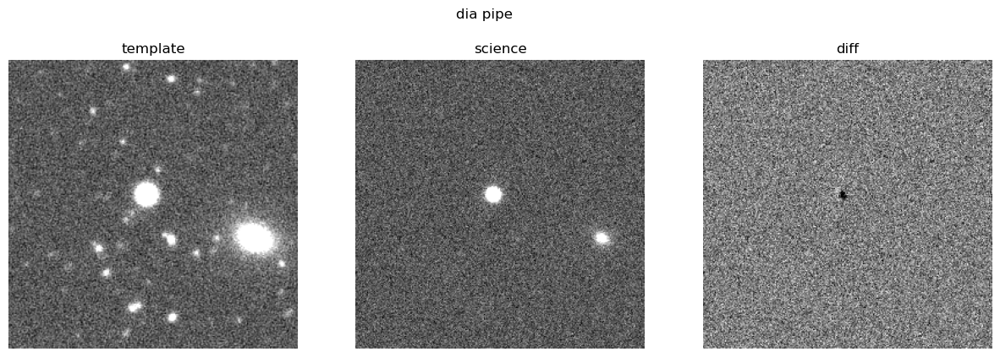

In [53]:
crop_size = 250
x, y = 700, 750
delta = int(crop_size / 2)
coadd_cropped = coadd_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
calexp_cropped = calexp.getImage().array[y-delta:y+delta, x-delta:x+delta]
diff_cropped = diff_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
display_images(template=coadd_cropped, science=calexp_cropped,
               difference=diff_cropped, title='dia pipe', scale='zscale')

kernel bases normalized


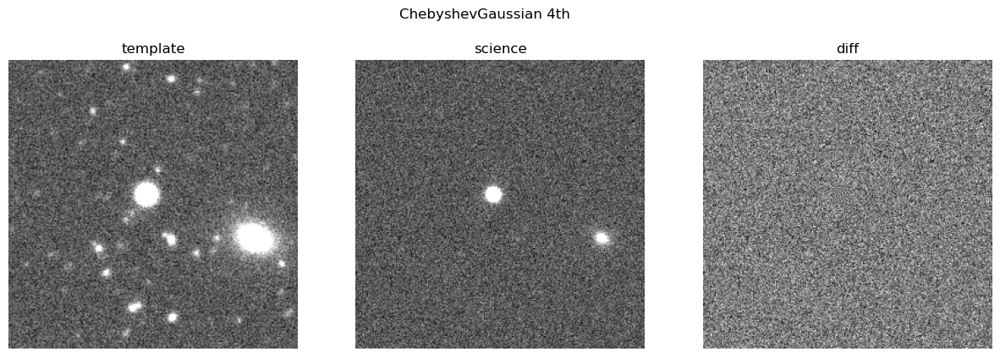

In [12]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 4th', scale='zscale')

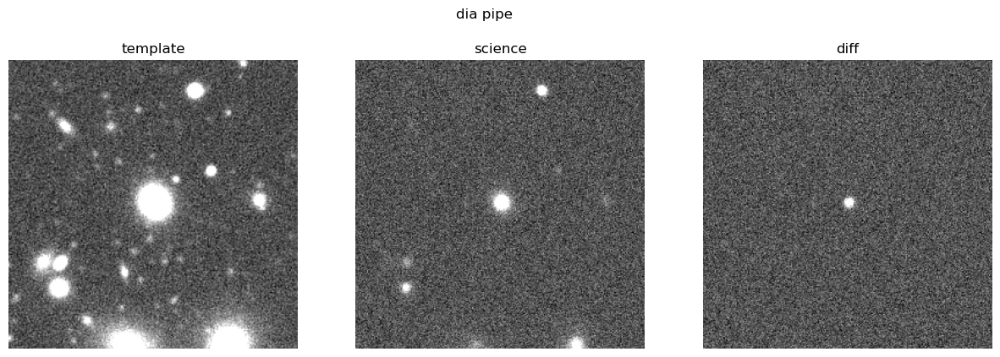

In [60]:
source_id = 1
crop_size = 250
x, y = int(non_saturation[source_id]['base_NaiveCentroid_x']), int(non_saturation[source_id]['base_NaiveCentroid_y'])
delta = int(crop_size / 2)
coadd_cropped = coadd_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
calexp_cropped = calexp.getImage().array[y-delta:y+delta, x-delta:x+delta]
diff_cropped = diff_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
display_images(template=coadd_cropped, science=calexp_cropped,
               difference=diff_cropped, title='dia pipe', scale='zscale')

kernel bases normalized
[[-0.01469744  0.00390514  0.03447133 ...  1.         -0.496
  -0.492     ]
 [-0.01469744  0.00390514  0.03447133 ...  1.         -0.496
  -0.492     ]
 [-0.01469744  0.00390514  0.03447133 ...  1.         -0.496
  -0.492     ]
 ...
 [-0.01469744  0.00390514  0.03447133 ...  1.         -0.496
  -0.492     ]
 [-0.01469744  0.00390514  0.03447133 ...  1.         -0.496
  -0.492     ]
 [-0.01469744  0.00390514  0.03447133 ...  1.         -0.496
  -0.492     ]]


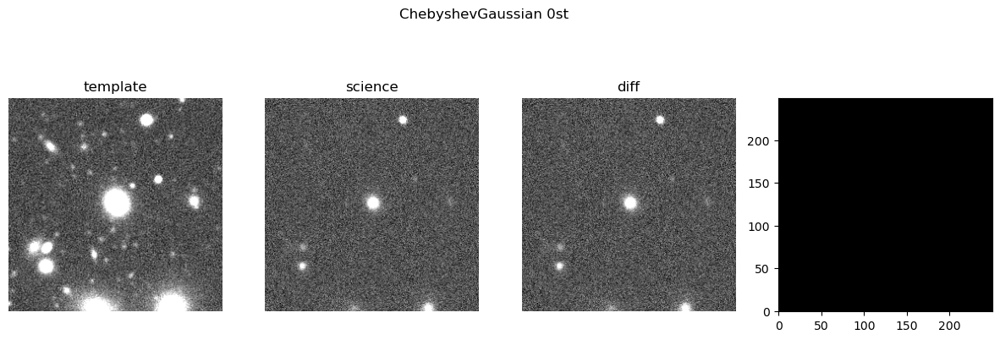

In [78]:
mask = np.ones((crop_size, crop_size))
r = 0
mask[crop_size//2-r: crop_size//2+r, crop_size//2-r: crop_size//2+r] = 0
mask = mask.astype('int')
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    mask = mask,
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, mask=mask,title='ChebyshevGaussian 0st', scale='zscale')

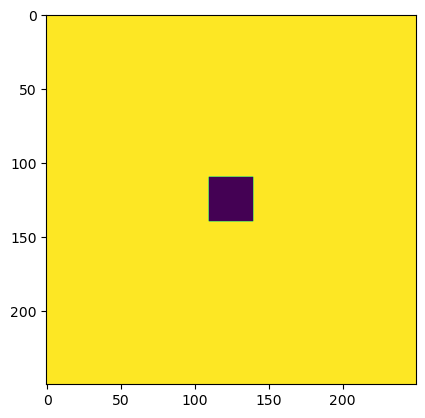

In [63]:
plt.imshow(mask)

kernel bases normalized


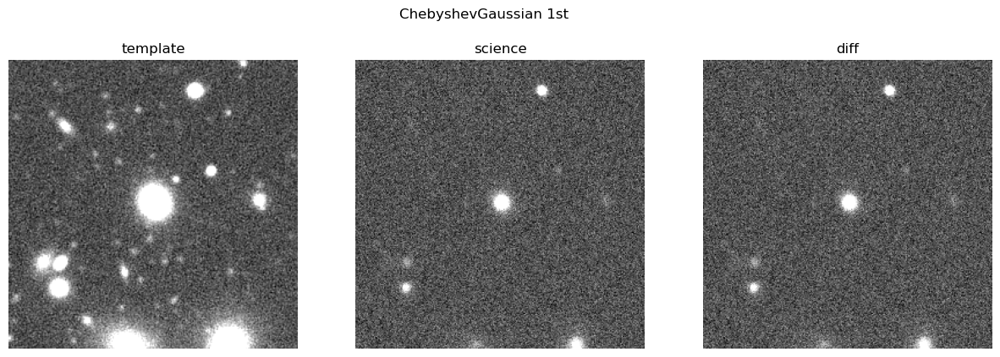

In [57]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped,
    mask=mask,
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 1st', scale='zscale')

kernel bases normalized


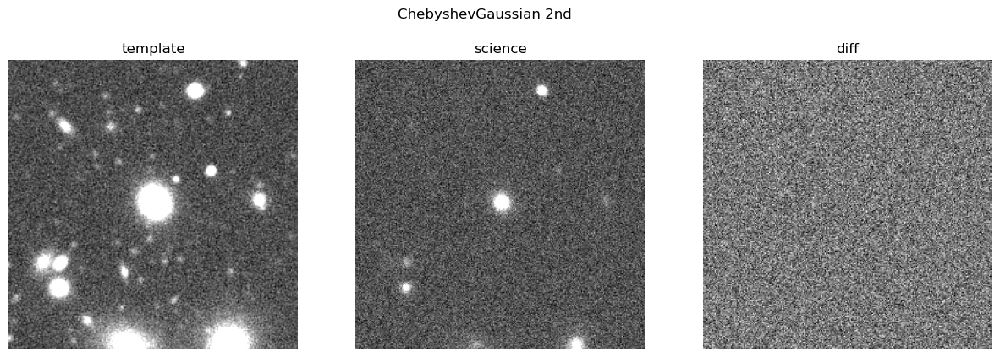

In [17]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=2), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 2nd', scale='zscale')

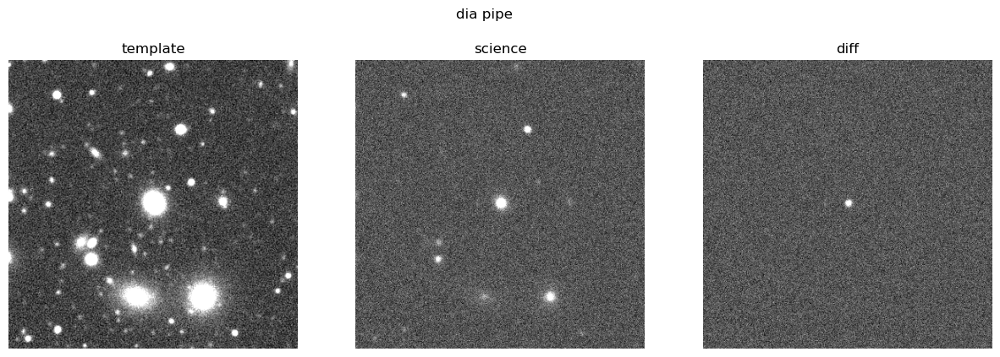

In [18]:
source_id = 1
crop_size = 380
x, y = int(non_saturation[source_id]['base_NaiveCentroid_x']), int(non_saturation[source_id]['base_NaiveCentroid_y'])
delta = int(crop_size / 2)
coadd_cropped = coadd_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
calexp_cropped = calexp.getImage().array[y-delta:y+delta, x-delta:x+delta]
diff_cropped = diff_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
display_images(template=coadd_cropped, science=calexp_cropped,
               difference=diff_cropped, title='dia pipe', scale='zscale')

kernel bases normalized


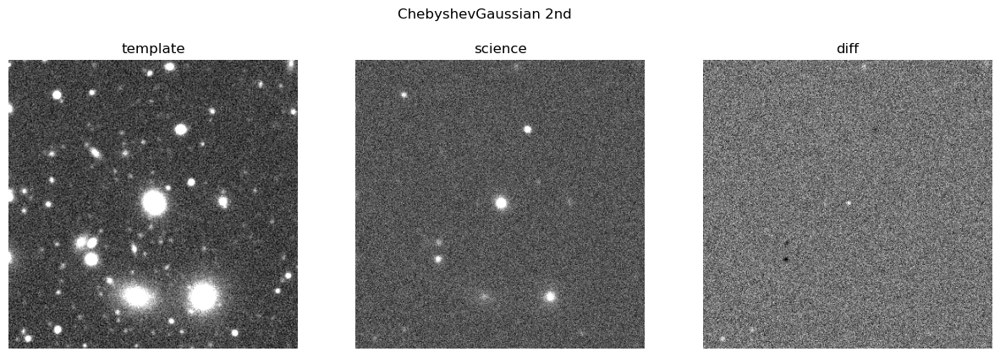

In [19]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(
        x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=2), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
    constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 2nd', scale='zscale')

kernel bases normalized


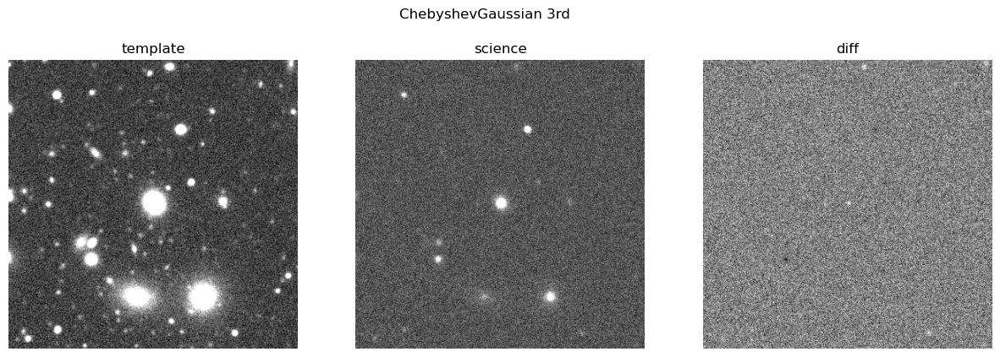

In [20]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(
        x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=3), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
    constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 3rd', scale='zscale')

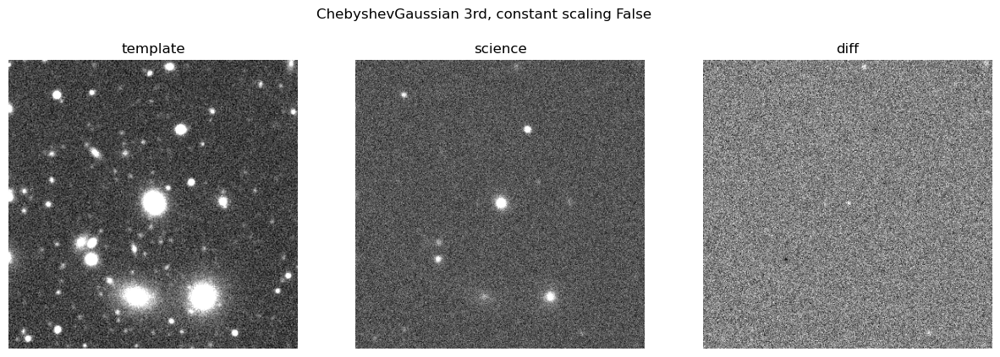

In [21]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(
        x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=3), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
    constant_scaling=False)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 3rd, constant scaling False', scale='zscale')

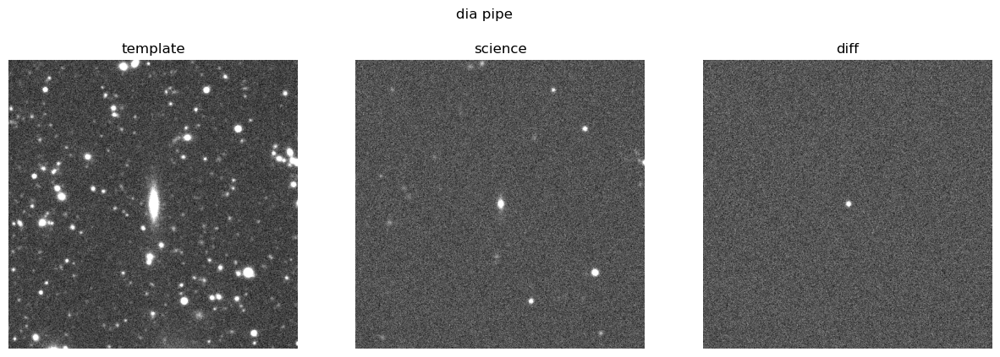

In [22]:
idx = 3
row = non_saturation[idx]
crop_size = 500
x, y = int(row['base_NaiveCentroid_x']), int(row['base_NaiveCentroid_y'])
delta = int(crop_size / 2)
coadd_cropped = coadd_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
calexp_cropped = calexp.getImage().array[y-delta:y+delta, x-delta:x+delta]
diff_cropped = diff_warped.getImage().array[y-delta:y+delta, x-delta:x+delta]
display_images(template=coadd_cropped, science=calexp_cropped,
               difference=diff_cropped, title='dia pipe', scale='zscale')

kernel bases normalized


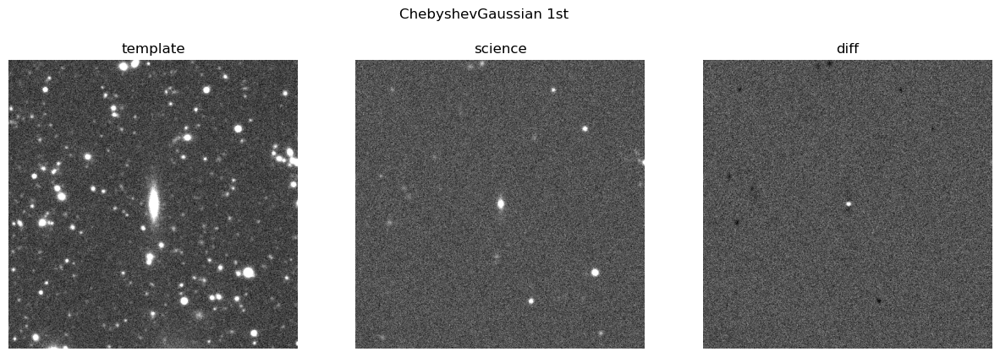

In [23]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(
        x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
    constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 1st', scale='zscale')

kernel bases normalized


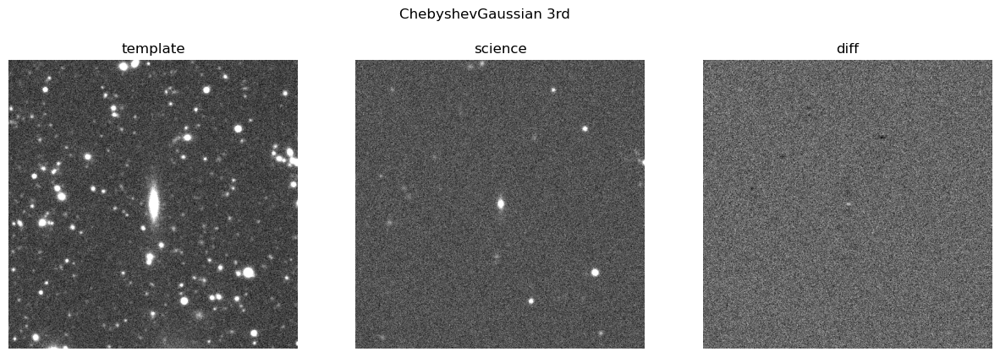

In [24]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(
        x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=3), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
    constant_scaling=True)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 3rd', scale='zscale')

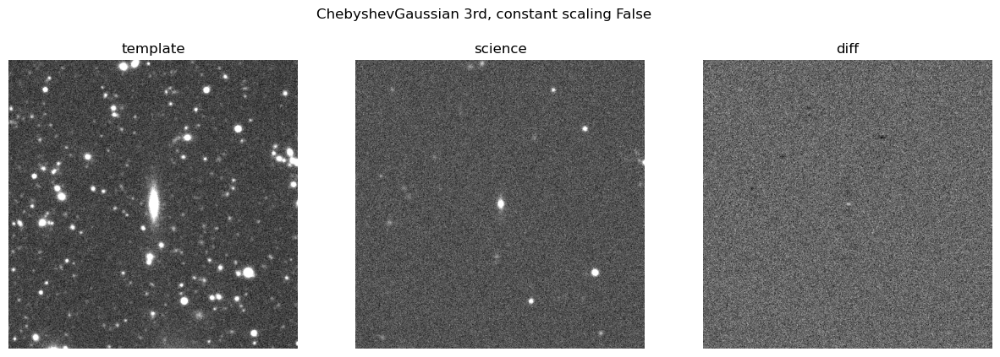

In [25]:
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = coadd_cropped,
    science = calexp_cropped, 
    kernel_bases = ChebyshevGaussianBases(
        kernel_size=31, gaussian_sigmas=[0.75, 1.5, 3.0], poly_degrees= [4, 2, 2]),
    spatial_model = PolyModel(
        x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=3), 
    bg_model = PolyModel(x_size=coadd_cropped.shape[1], y_size=coadd_cropped.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(),
    constant_scaling=False)
display_images(template=coadd_cropped, science=calexp_cropped, difference=difference, title='ChebyshevGaussian 3rd, constant scaling False', scale='zscale')

In [52]:
#non_saturation.columns

# peak pixel

kernel bases normalized


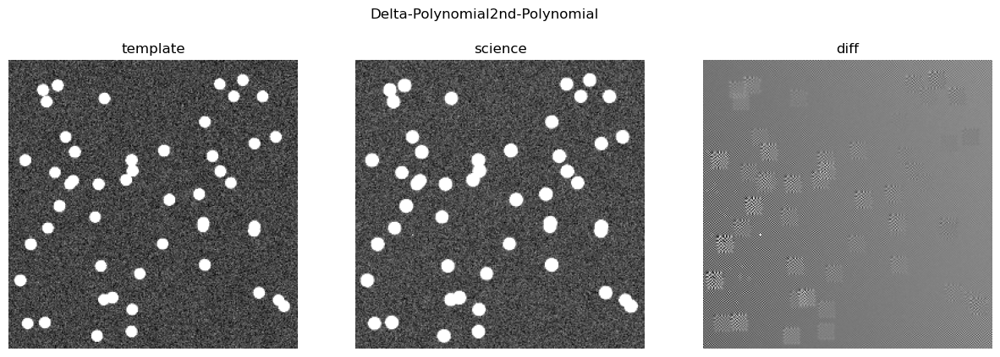

In [30]:
image_size = 255
period = image_size * 2
spatial_strength = 0.01
spatial_strength = 0.
# simulate source catalog
n_background_sources = 50
# image size
edge_offset = 10
x_lim = (- image_size//2 + 1 + edge_offset, image_size//2 + 1 - edge_offset)
y_lim = (- image_size//2 + 1 + edge_offset, image_size//2 + 1 - edge_offset)
# fluxes
min_flux, max_flux = 20000, 50000
# background source
background_src_cat = sim_source_catalog(
    n_background_sources, x_lim,  y_lim, min_flux, max_flux, random_seed=1
)
# image sigma
tmpl_sky_sig, sci_sky_sig = 0.2, 0.2
tmpl_psf_sig, sci_psf_sig = 1.6, 2.2
# simulate images
template = sim_image(image_size, tmpl_sky_sig, tmpl_psf_sig, background_src_cat, T=period, alpha=0)
science = sim_image(image_size, sci_sky_sig, sci_psf_sig, background_src_cat, T=period, alpha=spatial_strength)



science[100, 50] = 50000
difference, regressor, X, y = AlardLuptonAlgorithm(
    template = template,
    science = science, 
    kernel_bases = DeltaBases(kernel_size=11),
    spatial_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=2), 
    bg_model = PolyModel(x_size=template.shape[1], y_size=template.shape[0], degree=1), 
    regressor=linear_model.LinearRegression(fit_intercept=False))
display_images(template=template, science=science, difference=difference, title='Delta-Polynomial2nd-Polynomial')